In [4]:
import librosa
from audio_processing.process_audio import process_audio_array, process_audio_array_verbose
from audio_processing.dataset_loader import SpeechDatasetLoader

# We want to compare some models to see which one is the best for our data
dataset = SpeechDatasetLoader()
train = dataset.train
sampling_rate = 16000


In [2]:
def test_model(model):
    transcription, per, ground_truth_accuracy, text = process_audio_array_verbose(train[100]['audio']['array'], extraction_model=model, sample=train[100])

In [6]:
from audio_processing.phoneme_extractor import PhonemeExtractor
from phonecodes.phonecodes import ipa2arpabet

# test_model(PhonemeExtractor())
# test_model(PhonemeExtractor(model_name="vitouphy/wav2vec2-xls-r-300m-timit-phoneme", model_output_processing=lambda x: x))
# test_model(PhonemeExtractor(model_name="facebook/wav2vec2-large-960h-lv60-self", model_output_processing=lambda x: x))
# test_model(PhonemeExtractor(model_name="facebook/wav2vec2-large-960h-lv60-self", model_output_processing=lambda x: x))
test_model(PhonemeExtractor(model_name="Bluecast/wav2vec2-Phoneme", model_output_processing=lambda x: x))
test_model(PhonemeExtractor(model_name="speech31/wav2vec2-large-english-phoneme-v2", model_output_processing=lambda x: x))
test_model(PhonemeExtractor(model_name="aaniket/wav2vec2-large-xlsr-phoneme-recongition", model_output_processing=lambda x: x))
test_model(PhonemeExtractor(model_name="speech31/wav2vec2-large-TIMIT-IPA", model_output_processing=lambda x: x))

model name Bluecast/wav2vec2-Phoneme 

Ground truth text: IT'S NOT FISH
Transcription: ['ih t ih z ah n aoa d ah f ih sh ah']

Ground truth phonemes: ['IH', 'T', 'S', 'N', 'AH', 'T', 'F', 'IH', 'SH']
Predicted phonemes: ['ih t ih z ah n aoa d ah f ih sh ah']
Phoneme Error Rate: 100.00%
Ground truth accuracy: 80.00%

Translated grapheme ɪts nɑt fɪʃ


model name speech31/wav2vec2-large-english-phoneme-v2 

Ground truth text: IT'S NOT FISH
Transcription: ['ɪz ən oʊlð ˈfɪʃənn']

Ground truth phonemes: ['IH', 'T', 'S', 'N', 'AH', 'T', 'F', 'IH', 'SH']
Predicted phonemes: ['ɪz ən oʊlð ˈfɪʃənn']
Phoneme Error Rate: 100.00%
Ground truth accuracy: 80.00%

Translated grapheme ɪts nɑt fɪʃ


model name aaniket/wav2vec2-large-xlsr-phoneme-recongition 

Ground truth text: IT'S NOT FISH
Transcription: ['h# q ih z ix n ow z ax-h f ih sh h#']

Ground truth phonemes: ['IH', 'T', 'S', 'N', 'AH', 'T', 'F', 'IH', 'SH']
Predicted phonemes: ['h# q ih z ix n ow z ax-h f ih sh h#']
Phoneme Error Rate: 100.00%
Ground truth accuracy: 80.00%

Translated grapheme ɪts nɑt fɪʃ


model name speech31/wav2vec2-large-TIMIT-IPA 

Ground truth text: IT'S NOT FISH
Transcription: ['dɪz ən noʊtə fɪʃi']

Ground truth phonemes: ['IH', 'T', 'S', 'N', 'AH', 'T', 'F', 'IH', 'SH']
Predicted phonemes: ['dɪz ən noʊtə fɪʃi']
Phoneme Error Rate: 100.00%
Ground truth accuracy: 80.00%

Translated grapheme ɪts nɑt fɪʃ


C:\Users\bruce\AppData\Roaming\Python\Python38\site-packages\huggingface_hub\file_download.py:142: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\bruce\.cache\huggingface\hub\models--aaniket--wav2vec2-large-xlsr-phoneme-recongition. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)


In [9]:
models = [
PhonemeExtractor(),
PhonemeExtractor(model_name="vitouphy/wav2vec2-xls-r-300m-timit-phoneme", model_output_processing=lambda x: [item for item in ipa2arpabet(x[0], 'eng') if item != " " and item != ""]),
PhonemeExtractor(model_name="facebook/wav2vec2-large-960h-lv60-self", model_output_processing=lambda x: [item for item in x[0] if item != " " and item != ""]),
]

Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-large-960h-lv60-self and are newly initialized: ['wav2vec2.masked_spec_embed']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [10]:
import pandas as pd
import random

df = pd.DataFrame(columns=['model','transcription', 'per', 'ground_truth_accuracy', 'text'])
for i in random.sample(range(1, 1000), 100):
    sample = train[i]
    for model in models:
        transcription, per, ground_truth_accuracy, text = process_audio_array_verbose(sample['audio']['array'], extraction_model=model, sample=sample)

        new_row = pd.DataFrame([{
            'model': model.model_name, 
            'transcription': transcription, 
            'per': per, 
            'ground_truth_accuracy': ground_truth_accuracy, 
            'text': text,
            'sample': sample
        }])

        df = pd.concat([df,new_row], ignore_index=True)
df.to_json('output.json', orient='records', indent=4)

model name mirfan899/kids_phoneme_sm_model 

Ground truth text: THE MOVE IS A PART OF PLAN TO INCREASE PROFITS
Transcription: ['DH', 'EY', 'M', 'UW', 'V', 'IH', 'L', 'Z', 'AO', 'P', 'AE', 'AH', 'V', 'P', 'L', 'AE', 'N', 'UW', 'IH', 'NK', 'R', 'EH', 'S', 'P', 'R', 'AW', 'F', 'IH', 'T']

Ground truth phonemes: ['DH', 'AH', 'M', 'UW', 'V', 'IH', 'Z', 'AH', 'P', 'AA', 'T', 'AH', 'V', 'P', 'L', 'AE', 'N', 'T', 'UW', 'IH', 'N', 'K', 'R', 'IY', 'S', 'P', 'R', 'AA', 'F', 'IH', 'T', 'S']
Predicted phonemes: ['DH', 'EY', 'M', 'UW', 'V', 'IH', 'L', 'Z', 'AO', 'P', 'AE', 'AH', 'V', 'P', 'L', 'AE', 'N', 'UW', 'IH', 'NK', 'R', 'EH', 'S', 'P', 'R', 'AW', 'F', 'IH', 'T']
Phoneme Error Rate: 34.38%
Ground truth accuracy: 80.00%

Translated grapheme ['DH', 'AH', 'M', 'UW', 'V', 'IH', 'Z', 'AH', 'P', 'AA', 'R', 'T', 'AH', 'V', 'P', 'L', 'AE', 'N', 'T', 'UW', 'IH', 'N', 'K', 'R', 'IY', 'S', 'P', 'R', 'AA', 'F', 'IH', 'T', 'S']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: THE MOVE IS A PART OF PLAN TO INCREASE PROFITS
Transcription: ['DH', 'EY', 'M', 'UW', 'V', 'IY', 'Y', 'IY', 'Z', 'AA', 'R', 'P', 'AA', 'R', 'T', 'AH0', 'V', 'P', 'L', 'AE', 'N', 'ʧ', 'UW', 'IY', 'NG', 'K', 'R', 'IH', 'S', 'P', 'R', 'OW', 'F', 'IH', 'T', 'S']

Ground truth phonemes: ['DH', 'AH', 'M', 'UW', 'V', 'IH', 'Z', 'AH', 'P', 'AA', 'T', 'AH', 'V', 'P', 'L', 'AE', 'N', 'T', 'UW', 'IH', 'N', 'K', 'R', 'IY', 'S', 'P', 'R', 'AA', 'F', 'IH', 'T', 'S']
Predicted phonemes: ['DH', 'EY', 'M', 'UW', 'V', 'IY', 'Y', 'IY', 'Z', 'AA', 'R', 'P', 'AA', 'R', 'T', 'AH0', 'V', 'P', 'L', 'AE', 'N', 'ʧ', 'UW', 'IY', 'NG', 'K', 'R', 'IH', 'S', 'P', 'R', 'OW', 'F', 'IH', 'T', 'S']
Phoneme Error Rate: 40.62%
Ground truth accuracy: 80.00%

Translated grapheme ['DH', 'AH', 'M', 'UW', 'V', 'IH', 'Z', 'AH', 'P', 'AA', 'R', 'T', 'AH', 'V', 'P', 'L', 'AE', 'N', 'T', 'UW', 'IH', 'N', 'K', 'R', 'IY', 'S', 'P', 'R', 'AA', 'F', 'IH', 'T',

model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: THE MOVE IS A PART OF PLAN TO INCREASE PROFITS
Transcription: ['T', 'H', 'E', 'M', 'O', 'V', 'I', 'E', 'S', 'A', 'R', 'E', 'P', 'A', 'R', 'T', 'O', 'F', 'P', 'L', 'A', 'N', 'T', 'R', 'U', 'L', 'I', 'N', 'C', 'R', 'E', 'A', 'S', 'E', 'P', 'R', 'O', 'F', 'I', 'T', 'S']

Ground truth phonemes: ['DH', 'AH', 'M', 'UW', 'V', 'IH', 'Z', 'AH', 'P', 'AA', 'T', 'AH', 'V', 'P', 'L', 'AE', 'N', 'T', 'UW', 'IH', 'N', 'K', 'R', 'IY', 'S', 'P', 'R', 'AA', 'F', 'IH', 'T', 'S']
Predicted phonemes: ['T', 'H', 'E', 'M', 'O', 'V', 'I', 'E', 'S', 'A', 'R', 'E', 'P', 'A', 'R', 'T', 'O', 'F', 'P', 'L', 'A', 'N', 'T', 'R', 'U', 'L', 'I', 'N', 'C', 'R', 'E', 'A', 'S', 'E', 'P', 'R', 'O', 'F', 'I', 'T', 'S']
Phoneme Error Rate: 78.12%
Ground truth accuracy: 80.00%

Translated grapheme ['DH', 'AH', 'M', 'UW', 'V', 'IH', 'Z', 'AH', 'P', 'AA', 'R', 'T', 'AH', 'V', 'P', 'L', 'AE', 'N', 'T', 'UW', 'IH', 'N', 'K', 'R', 'IY', 'S', 'P', 'R', 'AA', '

model name mirfan899/kids_phoneme_sm_model 

Ground truth text: THAT'S THE TRADE TIME I ASK
Transcription: ['DH', 'AE', 'T', 'S', 'DH', 'AH', 'T', 'R', 'IY', 'T', 'IH', 'T', 'AH', 'M', 'AY', 'AE', 'S', 'K', 'H', 'ER']

Ground truth phonemes: ['DH', 'AE', 'T', 'S', 'DH', 'AH', 'T', 'R', 'EY', 'D', 'T', 'AY', 'M', 'AY', 'AA', 'S', 'K']
Predicted phonemes: ['DH', 'AE', 'T', 'S', 'DH', 'AH', 'T', 'R', 'IY', 'T', 'IH', 'T', 'AH', 'M', 'AY', 'AE', 'S', 'K', 'H', 'ER']
Phoneme Error Rate: 41.18%
Ground truth accuracy: 80.00%

Translated grapheme ['DH', 'AE', 'T', 'S', 'DH', 'AH', 'T', 'R', 'EY', 'D', 'T', 'AY', 'M', 'AY', 'AE', 'S', 'K']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: THAT'S THE TRADE TIME I ASK
Transcription: ['DH', 'AE', 'S', 'Z', 'AA', 'T', 'R', 'IY', 'T', 'IH', 'T', 'AE', 'M', 'AA', 'AY', 'AA', 'S', 'K', 'AH0']

Ground truth phonemes: ['DH', 'AE', 'T', 'S', 'DH', 'AH', 'T', 'R', 'EY', 'D', 'T', 'AY', 'M', 'AY', 'AA', 'S', 'K']
Predicted phonemes: ['DH', 'AE', 'S', 'Z', 'AA', 'T', 'R', 'IY', 'T', 'IH', 'T', 'AE', 'M', 'AA', 'AY', 'AA', 'S', 'K', 'AH0']
Phoneme Error Rate: 52.94%
Ground truth accuracy: 80.00%

Translated grapheme ['DH', 'AE', 'T', 'S', 'DH', 'AH', 'T', 'R', 'EY', 'D', 'T', 'AY', 'M', 'AY', 'AE', 'S', 'K']


model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: THAT'S THE TRADE TIME I ASK
Transcription: ['T', 'H', 'A', 'T', "'", 'S', 'T', 'H', 'E', 'T', 'R', 'E', 'A', 'T', 'E', 'T', 'I', 'M', 'O', 'R', 'E', 'I', 'A', 'S', 'K', 'H', 'E', 'R']

Ground truth phonemes: ['DH', 'AE', 'T', 'S', 'DH', 'AH', 'T', 'R', 'EY', 'D', 'T', 'AY', 'M', 'AY', 'AA', 'S', 'K']
Predicted phonemes: ['T', 'H', 'A', 'T', "'", 'S', 'T', 'H', 'E', 'T', 'R', 'E', 'A', 'T', 'E', 'T', 'I', 'M', 'O', 'R', 'E', 'I', 'A', 'S', 'K', 'H', 'E', 'R']
Phoneme Error Rate: 117.65%
Ground truth accuracy: 80.00%

Translated grapheme ['DH', 'AE', 'T', 'S', 'DH', 'AH', 'T', 'R', 'EY', 'D', 'T', 'AY', 'M', 'AY', 'AE', 'S', 'K']


model name mirfan899/kids_phoneme_sm_model 

Ground truth text: JUST WANT TO CONTINUE TO MIX THINGS UP A BIT
Transcription: ['JH', 'AH', 'S', 'T', 'W', 'A', 'NT', 'T', 'UW', 'K', 'AH', 'N', 'T', 'IH', 'N', 'Y', 'UW', 'T', 'UW', 'M', 'EY', 'K', 'AH', 'TH', 'IHNG', 'S', 'AH', 'P', 'B', 'EY', 'T']

Ground truth phonemes: ['JH', 'AH', 'S', 'T', 'W', 'AH', 'N', 'T', 'T', 'UW', 'K', 'AH', 'N', 'T', 'IH', 'N', 'Y', 'UW', 'T', 'UW', 'M', 'IH', 'K', 'S', 'TH', 'IH', 'NG', 'Z', 'AH', 'P', 'AH', 'B', 'IH', 'T']
Predicted phonemes: ['JH', 'AH', 'S', 'T', 'W', 'A', 'NT', 'T', 'UW', 'K', 'AH', 'N', 'T', 'IH', 'N', 'Y', 'UW', 'T', 'UW', 'M', 'EY', 'K', 'AH', 'TH', 'IHNG', 'S', 'AH', 'P', 'B', 'EY', 'T']
Phoneme Error Rate: 29.41%
Ground truth accuracy: 90.00%

Translated grapheme ['JH', 'AH', 'S', 'T', 'W', 'AA', 'N', 'T', 'T', 'UW', 'K', 'AH', 'N', 'T', 'IH', 'N', 'Y', 'UW', 'T', 'UW', 'M', 'IH', 'K', 'S', 'TH', 'IH', 'NG', 'Z', 'AH', 'P', 'AH', 'B', 'IH', 'T']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: JUST WANT TO CONTINUE TO MIX THINGS UP A BIT
Transcription: ['ʤ', 'AH0', 'S', 'T', 'AH0', 'W', 'AH0', 'N', 'T', 'UW', 'K', 'IH', 'N', 'T', 'IY', 'N', 'Y', 'UW', 'T', 'IH', 'M', 'EY', 'K', 'S', 'TH', 'IY', 'NG', 'Z', 'AH0', 'P', 'AH0', 'B', 'EY', 'T']

Ground truth phonemes: ['JH', 'AH', 'S', 'T', 'W', 'AH', 'N', 'T', 'T', 'UW', 'K', 'AH', 'N', 'T', 'IH', 'N', 'Y', 'UW', 'T', 'UW', 'M', 'IH', 'K', 'S', 'TH', 'IH', 'NG', 'Z', 'AH', 'P', 'AH', 'B', 'IH', 'T']
Predicted phonemes: ['ʤ', 'AH0', 'S', 'T', 'AH0', 'W', 'AH0', 'N', 'T', 'UW', 'K', 'IH', 'N', 'T', 'IY', 'N', 'Y', 'UW', 'T', 'IH', 'M', 'EY', 'K', 'S', 'TH', 'IY', 'NG', 'Z', 'AH0', 'P', 'AH0', 'B', 'EY', 'T']
Phoneme Error Rate: 38.24%
Ground truth accuracy: 90.00%

Translated grapheme ['JH', 'AH', 'S', 'T', 'W', 'AA', 'N', 'T', 'T', 'UW', 'K', 'AH', 'N', 'T', 'IH', 'N', 'Y', 'UW', 'T', 'UW', 'M', 'IH', 'K', 'S', 'TH', 'IH', 'NG', 'Z', 'AH', 'P', 'AH', 'B', 

model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: JUST WANT TO CONTINUE TO MIX THINGS UP A BIT
Transcription: ['J', 'U', 'S', 'T', 'T', 'H', 'E', 'O', 'N', 'E', 'T', 'O', 'C', 'O', 'N', 'T', 'I', 'N', 'U', 'E', 'T', 'O', 'M', 'I', 'X', 'T', 'H', 'I', 'N', 'G', 'S', 'U', 'P', 'A', 'B', 'I', 'T']

Ground truth phonemes: ['JH', 'AH', 'S', 'T', 'W', 'AH', 'N', 'T', 'T', 'UW', 'K', 'AH', 'N', 'T', 'IH', 'N', 'Y', 'UW', 'T', 'UW', 'M', 'IH', 'K', 'S', 'TH', 'IH', 'NG', 'Z', 'AH', 'P', 'AH', 'B', 'IH', 'T']
Predicted phonemes: ['J', 'U', 'S', 'T', 'T', 'H', 'E', 'O', 'N', 'E', 'T', 'O', 'C', 'O', 'N', 'T', 'I', 'N', 'U', 'E', 'T', 'O', 'M', 'I', 'X', 'T', 'H', 'I', 'N', 'G', 'S', 'U', 'P', 'A', 'B', 'I', 'T']
Phoneme Error Rate: 73.53%
Ground truth accuracy: 90.00%

Translated grapheme ['JH', 'AH', 'S', 'T', 'W', 'AA', 'N', 'T', 'T', 'UW', 'K', 'AH', 'N', 'T', 'IH', 'N', 'Y', 'UW', 'T', 'UW', 'M', 'IH', 'K', 'S', 'TH', 'IH', 'NG', 'Z', 'AH', 'P', 'AH', 'B', 'IH', 'T']


model name mirfan899/kids_phoneme_sm_model 

Ground truth text: SIR THREE PLANTING GRAFF
Transcription: ['S', 'OW', 'S', 'W', 'IY', 'P', 'AH', 'N', 'T', 'G', 'R', 'EH']

Ground truth phonemes: ['S', 'ER', 'TH', 'R', 'IY', 'P', 'L', 'AE', 'N', 'T', 'IH', 'NG', 'G', 'R', 'AA', 'F']
Predicted phonemes: ['S', 'OW', 'S', 'W', 'IY', 'P', 'AH', 'N', 'T', 'G', 'R', 'EH']
Phoneme Error Rate: 56.25%
Ground truth accuracy: 70.00%

Translated grapheme ['S', 'ER', 'TH', 'R', 'IY', 'P', 'L', 'AE', 'N', 'T', 'IH', 'NG', 'G', 'R', 'AE', 'F']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: SIR THREE PLANTING GRAFF
Transcription: ['S', 'IH', 'L', 'ER', 'S', 'W', 'IY', 'P', 'R', 'IY', 'N', 'ʧ', 'g', 'R', 'AH0', 'F']

Ground truth phonemes: ['S', 'ER', 'TH', 'R', 'IY', 'P', 'L', 'AE', 'N', 'T', 'IH', 'NG', 'G', 'R', 'AA', 'F']
Predicted phonemes: ['S', 'IH', 'L', 'ER', 'S', 'W', 'IY', 'P', 'R', 'IY', 'N', 'ʧ', 'g', 'R', 'AH0', 'F']
Phoneme Error Rate: 68.75%
Ground truth accuracy: 70.00%

Translated grapheme ['S', 'ER', 'TH', 'R', 'IY', 'P', 'L', 'AE', 'N', 'T', 'IH', 'NG', 'G', 'R', 'AE', 'F']


model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: SIR THREE PLANTING GRAFF
Transcription: ['S', 'I', 'S', 'W', 'E', 'P', 'I', 'N', 'T', 'G', 'R', 'A', 'T']

Ground truth phonemes: ['S', 'ER', 'TH', 'R', 'IY', 'P', 'L', 'AE', 'N', 'T', 'IH', 'NG', 'G', 'R', 'AA', 'F']
Predicted phonemes: ['S', 'I', 'S', 'W', 'E', 'P', 'I', 'N', 'T', 'G', 'R', 'A', 'T']
Phoneme Error Rate: 62.50%
Ground truth accuracy: 70.00%

Translated grapheme ['S', 'ER', 'TH', 'R', 'IY', 'P', 'L', 'AE', 'N', 'T', 'IH', 'NG', 'G', 'R', 'AE', 'F']


model name mirfan899/kids_phoneme_sm_model 

Ground truth text: BILLY CAN SEE THE VAN
Transcription: ['W', 'IY', 'S', 'IYDAH', 'W']

Ground truth phonemes: ['B', 'IH', 'L', 'IY', 'K', 'AE', 'N', 'S', 'IY', 'DH', 'AH', 'V', 'AE', 'N']
Predicted phonemes: ['W', 'IY', 'S', 'IYDAH', 'W']
Phoneme Error Rate: 85.71%
Ground truth accuracy: 80.00%

Translated grapheme ['B', 'IH', 'L', 'IY', 'K', 'AE', 'N', 'S', 'IY', 'DH', 'AH', 'V', 'AE', 'N']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: BILLY CAN SEE THE VAN
Transcription: ['HH', 'W', 'IY', 'W', 'IY', 'K', 'HH', 'AH0', 'S', 'IY', 'Z', 'AH0', 'W', 'EH', 'N']

Ground truth phonemes: ['B', 'IH', 'L', 'IY', 'K', 'AE', 'N', 'S', 'IY', 'DH', 'AH', 'V', 'AE', 'N']
Predicted phonemes: ['HH', 'W', 'IY', 'W', 'IY', 'K', 'HH', 'AH0', 'S', 'IY', 'Z', 'AH0', 'W', 'EH', 'N']
Phoneme Error Rate: 71.43%
Ground truth accuracy: 80.00%

Translated grapheme ['B', 'IH', 'L', 'IY', 'K', 'AE', 'N', 'S', 'IY', 'DH', 'AH', 'V', 'AE', 'N']


model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: BILLY CAN SEE THE VAN
Transcription: ['W', 'E', 'C', 'A', 'N', 'S', 'E', 'T', 'H', 'E', 'W', 'E', 'N']

Ground truth phonemes: ['B', 'IH', 'L', 'IY', 'K', 'AE', 'N', 'S', 'IY', 'DH', 'AH', 'V', 'AE', 'N']
Predicted phonemes: ['W', 'E', 'C', 'A', 'N', 'S', 'E', 'T', 'H', 'E', 'W', 'E', 'N']
Phoneme Error Rate: 85.71%
Ground truth accuracy: 80.00%

Translated grapheme ['B', 'IH', 'L', 'IY', 'K', 'AE', 'N', 'S', 'IY', 'DH', 'AH', 'V', 'AE', 'N']


model name mirfan899/kids_phoneme_sm_model 

Ground truth text: SEVEN FOUR ONE TWO
Transcription: ['S', 'EH', 'V', 'AH', 'N', 'F', 'AO', 'R', 'W', 'AH', 'N', 'T', 'UW']

Ground truth phonemes: ['S', 'EH', 'V', 'N', 'F', 'AO', 'R', 'W', 'AH', 'N', 'T', 'UW']
Predicted phonemes: ['S', 'EH', 'V', 'AH', 'N', 'F', 'AO', 'R', 'W', 'AH', 'N', 'T', 'UW']
Phoneme Error Rate: 8.33%
Ground truth accuracy: 100.00%

Translated grapheme ['S', 'EH', 'V', 'AH', 'N', 'F', 'AO', 'R', 'W', 'AH', 'N', 'T', 'UW']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: SEVEN FOUR ONE TWO
Transcription: ['S', 'EH', 'V', 'IH', 'N', 'F', 'AA', 'R', 'W', 'AH0', 'N', 'T', 'UW']

Ground truth phonemes: ['S', 'EH', 'V', 'N', 'F', 'AO', 'R', 'W', 'AH', 'N', 'T', 'UW']
Predicted phonemes: ['S', 'EH', 'V', 'IH', 'N', 'F', 'AA', 'R', 'W', 'AH0', 'N', 'T', 'UW']
Phoneme Error Rate: 25.00%
Ground truth accuracy: 100.00%

Translated grapheme ['S', 'EH', 'V', 'AH', 'N', 'F', 'AO', 'R', 'W', 'AH', 'N', 'T', 'UW']


model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: SEVEN FOUR ONE TWO
Transcription: ['S', 'E', 'V', 'E', 'N', 'F', 'O', 'U', 'R', 'O', 'N', 'E', 'T', 'W', 'O']

Ground truth phonemes: ['S', 'EH', 'V', 'N', 'F', 'AO', 'R', 'W', 'AH', 'N', 'T', 'UW']
Predicted phonemes: ['S', 'E', 'V', 'E', 'N', 'F', 'O', 'U', 'R', 'O', 'N', 'E', 'T', 'W', 'O']
Phoneme Error Rate: 75.00%
Ground truth accuracy: 100.00%

Translated grapheme ['S', 'EH', 'V', 'AH', 'N', 'F', 'AO', 'R', 'W', 'AH', 'N', 'T', 'UW']


model name mirfan899/kids_phoneme_sm_model 

Ground truth text: AMONG RUSSIANS THERE ARE MANY SUCH
Transcription: ['AH', 'M', 'AH', 'NG', 'R', 'AH', 'SH', 'AH', 'N', 'Z', 'S', 'EY', 'M', 'EH', 'N', 'IY', 'S', 'AH', 'CH']

Ground truth phonemes: ['AH', 'M', 'AH', 'NG', 'R', 'AH', 'SH', 'N', 'Z', 'DH', 'EH', 'R', 'AA', 'M', 'EH', 'N', 'IY', 'S', 'AH', 'CH']
Predicted phonemes: ['AH', 'M', 'AH', 'NG', 'R', 'AH', 'SH', 'AH', 'N', 'Z', 'S', 'EY', 'M', 'EH', 'N', 'IY', 'S', 'AH', 'CH']
Phoneme Error Rate: 25.00%
Ground truth accuracy: 80.00%

Translated grapheme ['AH', 'M', 'AH', 'NG', 'R', 'AH', 'SH', 'AH', 'N', 'Z', 'DH', 'EH', 'R', 'AA', 'R', 'M', 'EH', 'N', 'IY', 'S', 'AH', 'CH']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: AMONG RUSSIANS THERE ARE MANY SUCH
Transcription: ['AH0', 'M', 'AH0', 'NG', 'R', 'AH0', 'SH', 'IH', 'NG', 'Z', 'S', 'EY', 'AH0', 'AA', 'M', 'IH', 'N', 'IY', 'S', 'AH0', 'ʧ']

Ground truth phonemes: ['AH', 'M', 'AH', 'NG', 'R', 'AH', 'SH', 'N', 'Z', 'DH', 'EH', 'R', 'AA', 'M', 'EH', 'N', 'IY', 'S', 'AH', 'CH']
Predicted phonemes: ['AH0', 'M', 'AH0', 'NG', 'R', 'AH0', 'SH', 'IH', 'NG', 'Z', 'S', 'EY', 'AH0', 'AA', 'M', 'IH', 'N', 'IY', 'S', 'AH0', 'ʧ']
Phoneme Error Rate: 55.00%
Ground truth accuracy: 80.00%

Translated grapheme ['AH', 'M', 'AH', 'NG', 'R', 'AH', 'SH', 'AH', 'N', 'Z', 'DH', 'EH', 'R', 'AA', 'R', 'M', 'EH', 'N', 'IY', 'S', 'AH', 'CH']


model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: AMONG RUSSIANS THERE ARE MANY SUCH
Transcription: ['A', 'M', 'O', 'N', 'G', 'R', 'U', 'S', 'I', 'A', 'N', 'S', 'T', 'H', 'E', 'R', 'E', 'A', 'R', 'E', 'M', 'A', 'N', 'Y', 'S', 'U', 'C', 'H']

Ground truth phonemes: ['AH', 'M', 'AH', 'NG', 'R', 'AH', 'SH', 'N', 'Z', 'DH', 'EH', 'R', 'AA', 'M', 'EH', 'N', 'IY', 'S', 'AH', 'CH']
Predicted phonemes: ['A', 'M', 'O', 'N', 'G', 'R', 'U', 'S', 'I', 'A', 'N', 'S', 'T', 'H', 'E', 'R', 'E', 'A', 'R', 'E', 'M', 'A', 'N', 'Y', 'S', 'U', 'C', 'H']
Phoneme Error Rate: 105.00%
Ground truth accuracy: 80.00%

Translated grapheme ['AH', 'M', 'AH', 'NG', 'R', 'AH', 'SH', 'AH', 'N', 'Z', 'DH', 'EH', 'R', 'AA', 'R', 'M', 'EH', 'N', 'IY', 'S', 'AH', 'CH']


model name mirfan899/kids_phoneme_sm_model 

Ground truth text: LYNDA GOT ON MATTER CARES
Transcription: ['L', 'IH', 'N', 'D', 'AH', 'R', 'K', 'AW', 'OW', 'M', 'AE', 'CH', 'ER', 'K', 'EH', 'R']

Ground truth phonemes: ['L', 'IH', 'N', 'D', 'AH', 'G', 'AH', 'T', 'AH', 'N', 'M', 'AE', 'T', 'ER', 'K', 'EH', 'R', 'Z']
Predicted phonemes: ['L', 'IH', 'N', 'D', 'AH', 'R', 'K', 'AW', 'OW', 'M', 'AE', 'CH', 'ER', 'K', 'EH', 'R']
Phoneme Error Rate: 38.89%
Ground truth accuracy: 70.00%

Translated grapheme ['L', 'IH', 'N', 'D', 'AH', 'G', 'AA', 'T', 'AA', 'N', 'M', 'AE', 'T', 'ER', 'K', 'EH', 'R', 'Z']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: LYNDA GOT ON MATTER CARES
Transcription: ['DH', 'IH', 'IY', 'N', 'D', 'AA', 'K', 'W', 'AA', 'ʧ', 'AA', 'M', 'AA', 'ʧ', 'AH0', 'L', 'K', 'EH', 'R', 'AH0', 'S']

Ground truth phonemes: ['L', 'IH', 'N', 'D', 'AH', 'G', 'AH', 'T', 'AH', 'N', 'M', 'AE', 'T', 'ER', 'K', 'EH', 'R', 'Z']
Predicted phonemes: ['DH', 'IH', 'IY', 'N', 'D', 'AA', 'K', 'W', 'AA', 'ʧ', 'AA', 'M', 'AA', 'ʧ', 'AH0', 'L', 'K', 'EH', 'R', 'AH0', 'S']
Phoneme Error Rate: 77.78%
Ground truth accuracy: 70.00%

Translated grapheme ['L', 'IH', 'N', 'D', 'AH', 'G', 'AA', 'T', 'AA', 'N', 'M', 'AE', 'T', 'ER', 'K', 'EH', 'R', 'Z']


model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: LYNDA GOT ON MATTER CARES
Transcription: ['L', 'I', 'N', 'D', 'A', 'C', 'O', 'C', 'H', 'O', 'N', 'M', 'A', 'T', 'C', 'H', 'E', 'C', 'A', 'R', 'S']

Ground truth phonemes: ['L', 'IH', 'N', 'D', 'AH', 'G', 'AH', 'T', 'AH', 'N', 'M', 'AE', 'T', 'ER', 'K', 'EH', 'R', 'Z']
Predicted phonemes: ['L', 'I', 'N', 'D', 'A', 'C', 'O', 'C', 'H', 'O', 'N', 'M', 'A', 'T', 'C', 'H', 'E', 'C', 'A', 'R', 'S']
Phoneme Error Rate: 77.78%
Ground truth accuracy: 70.00%

Translated grapheme ['L', 'IH', 'N', 'D', 'AH', 'G', 'AA', 'T', 'AA', 'N', 'M', 'AE', 'T', 'ER', 'K', 'EH', 'R', 'Z']


model name mirfan899/kids_phoneme_sm_model 

Ground truth text: JACK ME GOT ON THE BUS
Transcription: ['T', 'IH', 'K', 'M', 'IY', 'N', 'K', 'AOR', 'Z', 'OW', 'N', 'DH', 'AH', 'B', 'AH', 'S']

Ground truth phonemes: ['JH', 'AE', 'K', 'M', 'IY', 'G', 'AH', 'T', 'AH', 'N', 'DH', 'AH', 'B', 'AH', 'S']
Predicted phonemes: ['T', 'IH', 'K', 'M', 'IY', 'N', 'K', 'AOR', 'Z', 'OW', 'N', 'DH', 'AH', 'B', 'AH', 'S']
Phoneme Error Rate: 46.67%
Ground truth accuracy: 80.00%

Translated grapheme ['JH', 'AE', 'K', 'M', 'IY', 'G', 'AA', 'T', 'AA', 'N', 'DH', 'AH', 'B', 'AH', 'S']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: JACK ME GOT ON THE BUS
Transcription: ['ʧ', 'EH', 'K', 'AH0', 'M', 'IY', 'N', 'K', 'AA', 'S', 'OW', 'N', 'Z', 'AH0', 'P', 'AA', 'S']

Ground truth phonemes: ['JH', 'AE', 'K', 'M', 'IY', 'G', 'AH', 'T', 'AH', 'N', 'DH', 'AH', 'B', 'AH', 'S']
Predicted phonemes: ['ʧ', 'EH', 'K', 'AH0', 'M', 'IY', 'N', 'K', 'AA', 'S', 'OW', 'N', 'Z', 'AH0', 'P', 'AA', 'S']
Phoneme Error Rate: 80.00%
Ground truth accuracy: 80.00%

Translated grapheme ['JH', 'AE', 'K', 'M', 'IY', 'G', 'AA', 'T', 'AA', 'N', 'DH', 'AH', 'B', 'AH', 'S']


model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: JACK ME GOT ON THE BUS
Transcription: ['T', 'E', 'K', 'M', 'E', 'N', 'C', 'O', 'T', 'O', 'N', 'D', 'E', 'P', 'A', 'S']

Ground truth phonemes: ['JH', 'AE', 'K', 'M', 'IY', 'G', 'AH', 'T', 'AH', 'N', 'DH', 'AH', 'B', 'AH', 'S']
Predicted phonemes: ['T', 'E', 'K', 'M', 'E', 'N', 'C', 'O', 'T', 'O', 'N', 'D', 'E', 'P', 'A', 'S']
Phoneme Error Rate: 73.33%
Ground truth accuracy: 80.00%

Translated grapheme ['JH', 'AE', 'K', 'M', 'IY', 'G', 'AA', 'T', 'AA', 'N', 'DH', 'AH', 'B', 'AH', 'S']


model name mirfan899/kids_phoneme_sm_model 

Ground truth text: SANDY HAS A BEAUTIFUL SHORTS
Transcription: ['S', 'AE', 'N', 'D', 'IY', 'H', 'AE', 'Z', 'AH', 'P', 'IH', 'L', 'F', 'AO', 'R', 'SH', 'AO', 'R', 'T']

Ground truth phonemes: ['S', 'AE', 'N', 'D', 'IY', 'HH', 'AE', 'Z', 'AH', 'B', 'Y', 'UW', 'T', 'IH', 'F', 'L', 'SH', 'AO', 'T', 'S']
Predicted phonemes: ['S', 'AE', 'N', 'D', 'IY', 'H', 'AE', 'Z', 'AH', 'P', 'IH', 'L', 'F', 'AO', 'R', 'SH', 'AO', 'R', 'T']
Phoneme Error Rate: 50.00%
Ground truth accuracy: 80.00%

Translated grapheme ['S', 'AE', 'N', 'D', 'IY', 'HH', 'AE', 'Z', 'AH', 'B', 'Y', 'UW', 'T', 'AH', 'F', 'AH', 'L', 'SH', 'AO', 'R', 'T', 'S']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: SANDY HAS A BEAUTIFUL SHORTS
Transcription: ['S', 'AE', 'N', 'D', 'IY', 'HH', 'AE', 'Z', 'AH0', 'B', 'IH', 'D', 'F', 'AA', 'SH', 'AA', 'T', 'S']

Ground truth phonemes: ['S', 'AE', 'N', 'D', 'IY', 'HH', 'AE', 'Z', 'AH', 'B', 'Y', 'UW', 'T', 'IH', 'F', 'L', 'SH', 'AO', 'T', 'S']
Predicted phonemes: ['S', 'AE', 'N', 'D', 'IY', 'HH', 'AE', 'Z', 'AH0', 'B', 'IH', 'D', 'F', 'AA', 'SH', 'AA', 'T', 'S']
Phoneme Error Rate: 35.00%
Ground truth accuracy: 80.00%

Translated grapheme ['S', 'AE', 'N', 'D', 'IY', 'HH', 'AE', 'Z', 'AH', 'B', 'Y', 'UW', 'T', 'AH', 'F', 'AH', 'L', 'SH', 'AO', 'R', 'T', 'S']


model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: SANDY HAS A BEAUTIFUL SHORTS
Transcription: ['S', 'A', 'N', 'D', 'Y', 'H', 'A', 'S', 'A', 'B', 'I', 'T', 'F', 'O', 'R', 'S', 'H', 'O', 'R', 'T', 'S']

Ground truth phonemes: ['S', 'AE', 'N', 'D', 'IY', 'HH', 'AE', 'Z', 'AH', 'B', 'Y', 'UW', 'T', 'IH', 'F', 'L', 'SH', 'AO', 'T', 'S']
Predicted phonemes: ['S', 'A', 'N', 'D', 'Y', 'H', 'A', 'S', 'A', 'B', 'I', 'T', 'F', 'O', 'R', 'S', 'H', 'O', 'R', 'T', 'S']
Phoneme Error Rate: 75.00%
Ground truth accuracy: 80.00%

Translated grapheme ['S', 'AE', 'N', 'D', 'IY', 'HH', 'AE', 'Z', 'AH', 'B', 'Y', 'UW', 'T', 'AH', 'F', 'AH', 'L', 'SH', 'AO', 'R', 'T', 'S']


model name mirfan899/kids_phoneme_sm_model 

Ground truth text: BUT THERE HAD BETTER NOT BE
Transcription: ['B', 'AH', 'T', 'DH', 'EY', 'H', 'AE', 'D', 'B', 'EH', 'T', 'ER', 'N', 'OW', 'DH', 'IY']

Ground truth phonemes: ['B', 'AH', 'T', 'DH', 'EH', 'R', 'HH', 'AE', 'D', 'B', 'EH', 'T', 'AH', 'N', 'AH', 'T', 'B', 'IY']
Predicted phonemes: ['B', 'AH', 'T', 'DH', 'EY', 'H', 'AE', 'D', 'B', 'EH', 'T', 'ER', 'N', 'OW', 'DH', 'IY']
Phoneme Error Rate: 38.89%
Ground truth accuracy: 90.00%

Translated grapheme ['B', 'AH', 'T', 'DH', 'EH', 'R', 'HH', 'AE', 'D', 'B', 'EH', 'T', 'ER', 'N', 'AA', 'T', 'B', 'IY']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: BUT THERE HAD BETTER NOT BE
Transcription: ['B', 'UH', 'DH', 'EH', 'HH', 'AA', 'B', 'EH', 'T', 'AH0', 'N', 'AA', 'B', 'IY']

Ground truth phonemes: ['B', 'AH', 'T', 'DH', 'EH', 'R', 'HH', 'AE', 'D', 'B', 'EH', 'T', 'AH', 'N', 'AH', 'T', 'B', 'IY']
Predicted phonemes: ['B', 'UH', 'DH', 'EH', 'HH', 'AA', 'B', 'EH', 'T', 'AH0', 'N', 'AA', 'B', 'IY']
Phoneme Error Rate: 44.44%
Ground truth accuracy: 90.00%

Translated grapheme ['B', 'AH', 'T', 'DH', 'EH', 'R', 'HH', 'AE', 'D', 'B', 'EH', 'T', 'ER', 'N', 'AA', 'T', 'B', 'IY']


model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: BUT THERE HAD BETTER NOT BE
Transcription: ['B', 'U', 'T', 'T', 'H', 'E', 'Y', 'H', 'A', 'D', 'B', 'E', 'T', 'E', 'R', 'N', 'O', 'T', 'B', 'E']

Ground truth phonemes: ['B', 'AH', 'T', 'DH', 'EH', 'R', 'HH', 'AE', 'D', 'B', 'EH', 'T', 'AH', 'N', 'AH', 'T', 'B', 'IY']
Predicted phonemes: ['B', 'U', 'T', 'T', 'H', 'E', 'Y', 'H', 'A', 'D', 'B', 'E', 'T', 'E', 'R', 'N', 'O', 'T', 'B', 'E']
Phoneme Error Rate: 66.67%
Ground truth accuracy: 90.00%

Translated grapheme ['B', 'AH', 'T', 'DH', 'EH', 'R', 'HH', 'AE', 'D', 'B', 'EH', 'T', 'ER', 'N', 'AA', 'T', 'B', 'IY']


model name mirfan899/kids_phoneme_sm_model 

Ground truth text: SO LISA WENT ON TO PLAYGROUND
Transcription: ['S', 'OW', 'W', 'IY', 'W', 'EH', 'N', 'T', 'UW', 'P', 'L', 'EY', 'G', 'R', 'AE', 'N']

Ground truth phonemes: ['S', 'OW', 'L', 'IY', 'S', 'AH', 'W', 'EH', 'N', 'T', 'AH', 'N', 'T', 'UW', 'P', 'L', 'EY', 'G', 'R', 'AW', 'N', 'D']
Predicted phonemes: ['S', 'OW', 'W', 'IY', 'W', 'EH', 'N', 'T', 'UW', 'P', 'L', 'EY', 'G', 'R', 'AE', 'N']
Phoneme Error Rate: 36.36%
Ground truth accuracy: 80.00%

Translated grapheme ['S', 'OW', 'L', 'IY', 'S', 'AH', 'W', 'EH', 'N', 'T', 'AA', 'N', 'T', 'UW', 'P', 'L', 'EY', 'G', 'R', 'AW', 'N', 'D']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: SO LISA WENT ON TO PLAYGROUND
Transcription: ['S', 'OW', 'L', 'IY', 'IH', 'S', 'AA', 'W', 'IH', 'T', 'AA', 'N', 'T', 'UW', 'P', 'R', 'EY', 'g', 'R', 'AH0', 'N', 'D']

Ground truth phonemes: ['S', 'OW', 'L', 'IY', 'S', 'AH', 'W', 'EH', 'N', 'T', 'AH', 'N', 'T', 'UW', 'P', 'L', 'EY', 'G', 'R', 'AW', 'N', 'D']
Predicted phonemes: ['S', 'OW', 'L', 'IY', 'IH', 'S', 'AA', 'W', 'IH', 'T', 'AA', 'N', 'T', 'UW', 'P', 'R', 'EY', 'g', 'R', 'AH0', 'N', 'D']
Phoneme Error Rate: 36.36%
Ground truth accuracy: 80.00%

Translated grapheme ['S', 'OW', 'L', 'IY', 'S', 'AH', 'W', 'EH', 'N', 'T', 'AA', 'N', 'T', 'UW', 'P', 'L', 'EY', 'G', 'R', 'AW', 'N', 'D']


model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: SO LISA WENT ON TO PLAYGROUND
Transcription: ['S', 'O', 'L', 'I', 'S', 'A', 'W', 'E', 'N', 'T', 'O', 'N', 'T', 'O', 'P', 'R', 'A', 'G', 'R', 'A', 'N', 'D']

Ground truth phonemes: ['S', 'OW', 'L', 'IY', 'S', 'AH', 'W', 'EH', 'N', 'T', 'AH', 'N', 'T', 'UW', 'P', 'L', 'EY', 'G', 'R', 'AW', 'N', 'D']
Predicted phonemes: ['S', 'O', 'L', 'I', 'S', 'A', 'W', 'E', 'N', 'T', 'O', 'N', 'T', 'O', 'P', 'R', 'A', 'G', 'R', 'A', 'N', 'D']
Phoneme Error Rate: 40.91%
Ground truth accuracy: 80.00%

Translated grapheme ['S', 'OW', 'L', 'IY', 'S', 'AH', 'W', 'EH', 'N', 'T', 'AA', 'N', 'T', 'UW', 'P', 'L', 'EY', 'G', 'R', 'AW', 'N', 'D']


model name mirfan899/kids_phoneme_sm_model 

Ground truth text: MINDER IS GOING TO SEE SPARE
Transcription: ['M', 'AEH', 'N', 'DH', 'AER', 'IH', 'Z', 'G', 'OW', 'IH', 'NG', 'TH', 'UW', 'S', 'IY', 'Z', 'P', 'EY']

Ground truth phonemes: ['M', 'AY', 'N', 'D', 'ER', 'IH', 'Z', 'G', 'OW', 'IH', 'NG', 'T', 'UW', 'S', 'IY', 'S', 'P', 'EH', 'R']
Predicted phonemes: ['M', 'AEH', 'N', 'DH', 'AER', 'IH', 'Z', 'G', 'OW', 'IH', 'NG', 'TH', 'UW', 'S', 'IY', 'Z', 'P', 'EY']
Phoneme Error Rate: 36.84%
Ground truth accuracy: 80.00%

Translated grapheme ['M', 'AY', 'N', 'D', 'ER', 'IH', 'Z', 'G', 'OW', 'IH', 'NG', 'T', 'UW', 'S', 'IY', 'S', 'P', 'EH', 'R']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: MINDER IS GOING TO SEE SPARE
Transcription: ['M', 'AE', 'N', 'D', 'AH0', 'IH', 'Z', 'g', 'OW', 'IY', 'NG', 'T', 'UW', 'S', 'IY', 'S', 'P', 'EY']

Ground truth phonemes: ['M', 'AY', 'N', 'D', 'ER', 'IH', 'Z', 'G', 'OW', 'IH', 'NG', 'T', 'UW', 'S', 'IY', 'S', 'P', 'EH', 'R']
Predicted phonemes: ['M', 'AE', 'N', 'D', 'AH0', 'IH', 'Z', 'g', 'OW', 'IY', 'NG', 'T', 'UW', 'S', 'IY', 'S', 'P', 'EY']
Phoneme Error Rate: 31.58%
Ground truth accuracy: 80.00%

Translated grapheme ['M', 'AY', 'N', 'D', 'ER', 'IH', 'Z', 'G', 'OW', 'IH', 'NG', 'T', 'UW', 'S', 'IY', 'S', 'P', 'EH', 'R']


model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: MINDER IS GOING TO SEE SPARE
Transcription: ['M', 'A', 'N', 'D', 'E', 'R', 'I', 'S', 'G', 'O', 'I', 'N', 'G', 'T', 'O', 'S', 'E', 'S', 'P', 'A']

Ground truth phonemes: ['M', 'AY', 'N', 'D', 'ER', 'IH', 'Z', 'G', 'OW', 'IH', 'NG', 'T', 'UW', 'S', 'IY', 'S', 'P', 'EH', 'R']
Predicted phonemes: ['M', 'A', 'N', 'D', 'E', 'R', 'I', 'S', 'G', 'O', 'I', 'N', 'G', 'T', 'O', 'S', 'E', 'S', 'P', 'A']
Phoneme Error Rate: 68.42%
Ground truth accuracy: 80.00%

Translated grapheme ['M', 'AY', 'N', 'D', 'ER', 'IH', 'Z', 'G', 'OW', 'IH', 'NG', 'T', 'UW', 'S', 'IY', 'S', 'P', 'EH', 'R']


model name mirfan899/kids_phoneme_sm_model 

Ground truth text: HAVE A LITTLE BIT OF FAITH LOVE
Transcription: ['H', 'IHB', 'AO', 'L', 'IH', 'H', 'ER', 'B', 'IH', 'T', 'AO', 'V', 'B', 'EY', 'Z', 'L', 'AH']

Ground truth phonemes: ['HH', 'AE', 'V', 'AH', 'L', 'IH', 'T', 'L', 'B', 'IH', 'T', 'AH', 'V', 'F', 'EY', 'TH', 'L', 'AH', 'V']
Predicted phonemes: ['H', 'IHB', 'AO', 'L', 'IH', 'H', 'ER', 'B', 'IH', 'T', 'AO', 'V', 'B', 'EY', 'Z', 'L', 'AH']
Phoneme Error Rate: 52.63%
Ground truth accuracy: 80.00%

Translated grapheme ['HH', 'AE', 'V', 'AH', 'L', 'IH', 'T', 'AH', 'L', 'B', 'IH', 'T', 'AH', 'V', 'F', 'EY', 'TH', 'L', 'AH', 'V']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: HAVE A LITTLE BIT OF FAITH LOVE
Transcription: ['HH', 'EH', 'V', 'AH0', 'L', 'IH', 'T', 'UH', 'B', 'IY', 'ʧ', 'OW', 'F', 'EY', 'S', 'L', 'AA', 'F']

Ground truth phonemes: ['HH', 'AE', 'V', 'AH', 'L', 'IH', 'T', 'L', 'B', 'IH', 'T', 'AH', 'V', 'F', 'EY', 'TH', 'L', 'AH', 'V']
Predicted phonemes: ['HH', 'EH', 'V', 'AH0', 'L', 'IH', 'T', 'UH', 'B', 'IY', 'ʧ', 'OW', 'F', 'EY', 'S', 'L', 'AA', 'F']
Phoneme Error Rate: 52.63%
Ground truth accuracy: 80.00%

Translated grapheme ['HH', 'AE', 'V', 'AH', 'L', 'IH', 'T', 'AH', 'L', 'B', 'IH', 'T', 'AH', 'V', 'F', 'EY', 'TH', 'L', 'AH', 'V']


model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: HAVE A LITTLE BIT OF FAITH LOVE
Transcription: ['H', 'A', 'V', 'E', 'A', 'L', 'I', 'T', 'L', 'E', 'B', 'I', 'T', 'O', 'F', 'I', 'S', 'L', 'A', 'G', 'H']

Ground truth phonemes: ['HH', 'AE', 'V', 'AH', 'L', 'IH', 'T', 'L', 'B', 'IH', 'T', 'AH', 'V', 'F', 'EY', 'TH', 'L', 'AH', 'V']
Predicted phonemes: ['H', 'A', 'V', 'E', 'A', 'L', 'I', 'T', 'L', 'E', 'B', 'I', 'T', 'O', 'F', 'I', 'S', 'L', 'A', 'G', 'H']
Phoneme Error Rate: 73.68%
Ground truth accuracy: 80.00%

Translated grapheme ['HH', 'AE', 'V', 'AH', 'L', 'IH', 'T', 'AH', 'L', 'B', 'IH', 'T', 'AH', 'V', 'F', 'EY', 'TH', 'L', 'AH', 'V']


model name mirfan899/kids_phoneme_sm_model 

Ground truth text: BOOK A PARTY WITH A DIFFERENCE
Transcription: ['B', 'UH', 'K', 'AH', 'P', 'AO', 'T', 'IY', 'W', 'IH', 'D', 'DH', 'AH', 'D', 'IH', 'F', 'ER', 'AH', 'N', 'T', 'S']

Ground truth phonemes: ['B', 'UH', 'K', 'AH', 'P', 'AA', 'T', 'IY', 'W', 'IH', 'DH', 'AH', 'D', 'IH', 'F', 'R', 'AH', 'N', 'S']
Predicted phonemes: ['B', 'UH', 'K', 'AH', 'P', 'AO', 'T', 'IY', 'W', 'IH', 'D', 'DH', 'AH', 'D', 'IH', 'F', 'ER', 'AH', 'N', 'T', 'S']
Phoneme Error Rate: 21.05%
Ground truth accuracy: 90.00%

Translated grapheme ['B', 'UH', 'K', 'AH', 'P', 'AA', 'R', 'T', 'IY', 'W', 'IH', 'DH', 'AH', 'D', 'IH', 'F', 'ER', 'AH', 'N', 'S']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: BOOK A PARTY WITH A DIFFERENCE
Transcription: ['B', 'UH', 'L', 'AH0', 'P', 'AA', 'R', 'ɾ', 'IY', 'W', 'IY', 'DH', 'IH', 'D', 'IY', 'F', 'R', 'IH', 'N', 'S']

Ground truth phonemes: ['B', 'UH', 'K', 'AH', 'P', 'AA', 'T', 'IY', 'W', 'IH', 'DH', 'AH', 'D', 'IH', 'F', 'R', 'AH', 'N', 'S']
Predicted phonemes: ['B', 'UH', 'L', 'AH0', 'P', 'AA', 'R', 'ɾ', 'IY', 'W', 'IY', 'DH', 'IH', 'D', 'IY', 'F', 'R', 'IH', 'N', 'S']
Phoneme Error Rate: 42.11%
Ground truth accuracy: 90.00%

Translated grapheme ['B', 'UH', 'K', 'AH', 'P', 'AA', 'R', 'T', 'IY', 'W', 'IH', 'DH', 'AH', 'D', 'IH', 'F', 'ER', 'AH', 'N', 'S']


model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: BOOK A PARTY WITH A DIFFERENCE
Transcription: ['B', 'O', 'K', 'A', 'P', 'A', 'R', 'T', 'Y', 'W', 'I', 'T', 'H', 'T', 'H', 'E', 'D', 'I', 'F', 'E', 'R', 'E', 'N', 'C', 'E']

Ground truth phonemes: ['B', 'UH', 'K', 'AH', 'P', 'AA', 'T', 'IY', 'W', 'IH', 'DH', 'AH', 'D', 'IH', 'F', 'R', 'AH', 'N', 'S']
Predicted phonemes: ['B', 'O', 'K', 'A', 'P', 'A', 'R', 'T', 'Y', 'W', 'I', 'T', 'H', 'T', 'H', 'E', 'D', 'I', 'F', 'E', 'R', 'E', 'N', 'C', 'E']
Phoneme Error Rate: 84.21%
Ground truth accuracy: 90.00%

Translated grapheme ['B', 'UH', 'K', 'AH', 'P', 'AA', 'R', 'T', 'IY', 'W', 'IH', 'DH', 'AH', 'D', 'IH', 'F', 'ER', 'AH', 'N', 'S']


model name mirfan899/kids_phoneme_sm_model 

Ground truth text: SPENDING TOO MUCH TIME ON A GAME
Transcription: ['S', 'P', 'EH', 'N', 'D', 'IH', 'N', 'UW', 'M', 'AH', 'CH', 'T', 'AY', 'M', 'AW', 'ER', 'G', 'EY', 'M']

Ground truth phonemes: ['S', 'P', 'EH', 'N', 'D', 'IH', 'NG', 'T', 'UW', 'M', 'AH', 'CH', 'T', 'AY', 'M', 'AH', 'N', 'AH', 'G', 'EY', 'M']
Predicted phonemes: ['S', 'P', 'EH', 'N', 'D', 'IH', 'N', 'UW', 'M', 'AH', 'CH', 'T', 'AY', 'M', 'AW', 'ER', 'G', 'EY', 'M']
Phoneme Error Rate: 23.81%
Ground truth accuracy: 90.00%

Translated grapheme ['S', 'P', 'EH', 'N', 'D', 'IH', 'NG', 'T', 'UW', 'M', 'AH', 'CH', 'T', 'AY', 'M', 'AA', 'N', 'AH', 'G', 'EY', 'M']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: SPENDING TOO MUCH TIME ON A GAME
Transcription: ['S', 'P', 'EH', 'N', 'IY', 'NG', 'T', 'UW', 'M', 'AH0', 'ʧ', 'T', 'AY', 'M', 'AA', 'AH0', 'g', 'EY', 'M']

Ground truth phonemes: ['S', 'P', 'EH', 'N', 'D', 'IH', 'NG', 'T', 'UW', 'M', 'AH', 'CH', 'T', 'AY', 'M', 'AH', 'N', 'AH', 'G', 'EY', 'M']
Predicted phonemes: ['S', 'P', 'EH', 'N', 'IY', 'NG', 'T', 'UW', 'M', 'AH0', 'ʧ', 'T', 'AY', 'M', 'AA', 'AH0', 'g', 'EY', 'M']
Phoneme Error Rate: 38.10%
Ground truth accuracy: 90.00%

Translated grapheme ['S', 'P', 'EH', 'N', 'D', 'IH', 'NG', 'T', 'UW', 'M', 'AH', 'CH', 'T', 'AY', 'M', 'AA', 'N', 'AH', 'G', 'EY', 'M']


model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: SPENDING TOO MUCH TIME ON A GAME
Transcription: ['S', 'P', 'E', 'N', 'D', 'I', 'N', 'G', 'T', 'O', 'M', 'U', 'C', 'H', 'T', 'I', 'M', 'E', 'O', 'N', 'G', 'A', 'M', 'E']

Ground truth phonemes: ['S', 'P', 'EH', 'N', 'D', 'IH', 'NG', 'T', 'UW', 'M', 'AH', 'CH', 'T', 'AY', 'M', 'AH', 'N', 'AH', 'G', 'EY', 'M']
Predicted phonemes: ['S', 'P', 'E', 'N', 'D', 'I', 'N', 'G', 'T', 'O', 'M', 'U', 'C', 'H', 'T', 'I', 'M', 'E', 'O', 'N', 'G', 'A', 'M', 'E']
Phoneme Error Rate: 66.67%
Ground truth accuracy: 90.00%

Translated grapheme ['S', 'P', 'EH', 'N', 'D', 'IH', 'NG', 'T', 'UW', 'M', 'AH', 'CH', 'T', 'AY', 'M', 'AA', 'N', 'AH', 'G', 'EY', 'M']


model name mirfan899/kids_phoneme_sm_model 

Ground truth text: LINDA CAN SEE THE SUN BOY
Transcription: ['H', 'IY', 'T', 'AO', 'K', 'T', 'AH', 'N', 'D', 'S', 'IY', 'Z', 'AH', 'S', 'AH', 'M', 'B', 'AOWW', 'EY']

Ground truth phonemes: ['L', 'IH', 'N', 'D', 'AH', 'K', 'AE', 'N', 'S', 'IY', 'DH', 'AH', 'S', 'AH', 'N', 'B', 'OY']
Predicted phonemes: ['H', 'IY', 'T', 'AO', 'K', 'T', 'AH', 'N', 'D', 'S', 'IY', 'Z', 'AH', 'S', 'AH', 'M', 'B', 'AOWW', 'EY']
Phoneme Error Rate: 70.59%
Ground truth accuracy: 70.00%

Translated grapheme ['L', 'IH', 'N', 'D', 'AH', 'K', 'AE', 'N', 'S', 'IY', 'DH', 'AH', 'S', 'AH', 'N', 'B', 'OY']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: LINDA CAN SEE THE SUN BOY
Transcription: ['IY', 'T', 'AA', 'K', 'IH', 'N', 'S', 'IY', 'Z', 'AH0', 'S', 'AH0', 'M', 'B', 'OW', 'W', 'IY']

Ground truth phonemes: ['L', 'IH', 'N', 'D', 'AH', 'K', 'AE', 'N', 'S', 'IY', 'DH', 'AH', 'S', 'AH', 'N', 'B', 'OY']
Predicted phonemes: ['IY', 'T', 'AA', 'K', 'IH', 'N', 'S', 'IY', 'Z', 'AH0', 'S', 'AH0', 'M', 'B', 'OW', 'W', 'IY']
Phoneme Error Rate: 76.47%
Ground truth accuracy: 70.00%

Translated grapheme ['L', 'IH', 'N', 'D', 'AH', 'K', 'AE', 'N', 'S', 'IY', 'DH', 'AH', 'S', 'AH', 'N', 'B', 'OY']


model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: LINDA CAN SEE THE SUN BOY
Transcription: ['Y', 'O', 'D', 'A', 'R', 'K', 'E', 'N', 'S', 'E', 'S', 'A', 'S', 'O', 'M', 'E', 'B', 'O', 'D', 'Y']

Ground truth phonemes: ['L', 'IH', 'N', 'D', 'AH', 'K', 'AE', 'N', 'S', 'IY', 'DH', 'AH', 'S', 'AH', 'N', 'B', 'OY']
Predicted phonemes: ['Y', 'O', 'D', 'A', 'R', 'K', 'E', 'N', 'S', 'E', 'S', 'A', 'S', 'O', 'M', 'E', 'B', 'O', 'D', 'Y']
Phoneme Error Rate: 88.24%
Ground truth accuracy: 70.00%

Translated grapheme ['L', 'IH', 'N', 'D', 'AH', 'K', 'AE', 'N', 'S', 'IY', 'DH', 'AH', 'S', 'AH', 'N', 'B', 'OY']


model name mirfan899/kids_phoneme_sm_model 

Ground truth text: BETTY NEEDS NEW SKIRT
Transcription: ['H', 'AEH', 'M', 'P', 'IY', 'TH', 'IY', 'N', 'IY', 'D', 'Z', 'DH', 'AH', 'N', 'UW', 'K', 'W', 'ER', 'T']

Ground truth phonemes: ['B', 'EH', 'T', 'IH', 'N', 'IY', 'D', 'Z', 'N', 'Y', 'UW', 'S', 'K', 'ER', 'T']
Predicted phonemes: ['H', 'AEH', 'M', 'P', 'IY', 'TH', 'IY', 'N', 'IY', 'D', 'Z', 'DH', 'AH', 'N', 'UW', 'K', 'W', 'ER', 'T']
Phoneme Error Rate: 80.00%
Ground truth accuracy: 70.00%

Translated grapheme ['B', 'EH', 'T', 'IY', 'N', 'IY', 'D', 'Z', 'N', 'UW', 'S', 'K', 'ER', 'T']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: BETTY NEEDS NEW SKIRT
Transcription: ['AH0', 'M', 'B', 'IY', 'T', 'IY', 'N', 'IY', 'S', 'DH', 'IH', 'N', 'UW', 'L', 'S', 'K', 'AA', 'R', 'T']

Ground truth phonemes: ['B', 'EH', 'T', 'IH', 'N', 'IY', 'D', 'Z', 'N', 'Y', 'UW', 'S', 'K', 'ER', 'T']
Predicted phonemes: ['AH0', 'M', 'B', 'IY', 'T', 'IY', 'N', 'IY', 'S', 'DH', 'IH', 'N', 'UW', 'L', 'S', 'K', 'AA', 'R', 'T']
Phoneme Error Rate: 73.33%
Ground truth accuracy: 70.00%

Translated grapheme ['B', 'EH', 'T', 'IY', 'N', 'IY', 'D', 'Z', 'N', 'UW', 'S', 'K', 'ER', 'T']


model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: BETTY NEEDS NEW SKIRT
Transcription: ['A', 'N', 'D', 'B', 'E', 'A', 'T', 'Y', 'N', 'E', 'D', 'S', 'T', 'H', 'E', 'N', 'E', 'W', 'S', 'Q', 'I', 'R', 'T']

Ground truth phonemes: ['B', 'EH', 'T', 'IH', 'N', 'IY', 'D', 'Z', 'N', 'Y', 'UW', 'S', 'K', 'ER', 'T']
Predicted phonemes: ['A', 'N', 'D', 'B', 'E', 'A', 'T', 'Y', 'N', 'E', 'D', 'S', 'T', 'H', 'E', 'N', 'E', 'W', 'S', 'Q', 'I', 'R', 'T']
Phoneme Error Rate: 106.67%
Ground truth accuracy: 70.00%

Translated grapheme ['B', 'EH', 'T', 'IY', 'N', 'IY', 'D', 'Z', 'N', 'UW', 'S', 'K', 'ER', 'T']


model name mirfan899/kids_phoneme_sm_model 

Ground truth text: PETER HAS A BEAUTIFUL HAT
Transcription: ['P', 'H', 'IY', 'T', 'ER', 'H', 'AE', 'Z', 'AH', 'B', 'Y', 'UW', 'T', 'IH', 'F', 'AH', 'L', 'H', 'AE', 'T']

Ground truth phonemes: ['P', 'IY', 'T', 'ER', 'HH', 'AE', 'Z', 'AH', 'B', 'Y', 'UW', 'T', 'IH', 'F', 'L', 'HH', 'AE', 'T']
Predicted phonemes: ['P', 'H', 'IY', 'T', 'ER', 'H', 'AE', 'Z', 'AH', 'B', 'Y', 'UW', 'T', 'IH', 'F', 'AH', 'L', 'H', 'AE', 'T']
Phoneme Error Rate: 22.22%
Ground truth accuracy: 80.00%

Translated grapheme ['P', 'IY', 'T', 'ER', 'HH', 'AE', 'Z', 'AH', 'B', 'Y', 'UW', 'T', 'AH', 'F', 'AH', 'L', 'HH', 'AE', 'T']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: PETER HAS A BEAUTIFUL HAT
Transcription: ['P', 'IY', 'T', 'AA', 'HH', 'AE', 'Z', 'AH0', 'B', 'Y', 'UW', 'L', 'T', 'IH', 'F', 'UH', 'L', 'HH', 'AE', 'T']

Ground truth phonemes: ['P', 'IY', 'T', 'ER', 'HH', 'AE', 'Z', 'AH', 'B', 'Y', 'UW', 'T', 'IH', 'F', 'L', 'HH', 'AE', 'T']
Predicted phonemes: ['P', 'IY', 'T', 'AA', 'HH', 'AE', 'Z', 'AH0', 'B', 'Y', 'UW', 'L', 'T', 'IH', 'F', 'UH', 'L', 'HH', 'AE', 'T']
Phoneme Error Rate: 22.22%
Ground truth accuracy: 80.00%

Translated grapheme ['P', 'IY', 'T', 'ER', 'HH', 'AE', 'Z', 'AH', 'B', 'Y', 'UW', 'T', 'AH', 'F', 'AH', 'L', 'HH', 'AE', 'T']


model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: PETER HAS A BEAUTIFUL HAT
Transcription: ['P', 'E', 'T', 'E', 'R', 'H', 'A', 'S', 'A', 'B', 'E', 'A', 'U', 'T', 'I', 'F', 'U', 'L', 'H', 'A', 'T']

Ground truth phonemes: ['P', 'IY', 'T', 'ER', 'HH', 'AE', 'Z', 'AH', 'B', 'Y', 'UW', 'T', 'IH', 'F', 'L', 'HH', 'AE', 'T']
Predicted phonemes: ['P', 'E', 'T', 'E', 'R', 'H', 'A', 'S', 'A', 'B', 'E', 'A', 'U', 'T', 'I', 'F', 'U', 'L', 'H', 'A', 'T']
Phoneme Error Rate: 77.78%
Ground truth accuracy: 80.00%

Translated grapheme ['P', 'IY', 'T', 'ER', 'HH', 'AE', 'Z', 'AH', 'B', 'Y', 'UW', 'T', 'AH', 'F', 'AH', 'L', 'HH', 'AE', 'T']


model name mirfan899/kids_phoneme_sm_model 

Ground truth text: NEIL IS GOOD AT BASKETBALL
Transcription: ['H', 'S', 'UH', 'AE', 'Z', 'B', 'AE', 'S', 'K', 'AH', 'T', 'B', 'AO', 'L']

Ground truth phonemes: ['N', 'IY', 'L', 'IH', 'Z', 'G', 'UH', 'D', 'AE', 'T', 'B', 'AA', 'S', 'K', 'IH', 'T', 'B', 'AO', 'L']
Predicted phonemes: ['H', 'S', 'UH', 'AE', 'Z', 'B', 'AE', 'S', 'K', 'AH', 'T', 'B', 'AO', 'L']
Phoneme Error Rate: 52.63%
Ground truth accuracy: 70.00%

Translated grapheme ['N', 'IY', 'L', 'IH', 'Z', 'G', 'UH', 'D', 'AE', 'T', 'B', 'AE', 'S', 'K', 'AH', 'T', 'B', 'AO', 'L']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: NEIL IS GOOD AT BASKETBALL
Transcription: ['N', 'AY', 'AA', 'Y', 'EH', 'S', 'g', 'UH', 'D', 'AA', 'S', 'B', 'AE', 'S', 'K', 'IH', 'T', 'B', 'AA']

Ground truth phonemes: ['N', 'IY', 'L', 'IH', 'Z', 'G', 'UH', 'D', 'AE', 'T', 'B', 'AA', 'S', 'K', 'IH', 'T', 'B', 'AO', 'L']
Predicted phonemes: ['N', 'AY', 'AA', 'Y', 'EH', 'S', 'g', 'UH', 'D', 'AA', 'S', 'B', 'AE', 'S', 'K', 'IH', 'T', 'B', 'AA']
Phoneme Error Rate: 57.89%
Ground truth accuracy: 70.00%

Translated grapheme ['N', 'IY', 'L', 'IH', 'Z', 'G', 'UH', 'D', 'AE', 'T', 'B', 'AE', 'S', 'K', 'AH', 'T', 'B', 'AO', 'L']


model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: NEIL IS GOOD AT BASKETBALL
Transcription: ['N', 'O', 'W', 'O', 'R', 'E', 'Y', 'E', 'S', 'G', 'O', 'D', 'A', 'S', 'B', 'A', 'S', 'K', 'E', 'T', 'B', 'A', 'L']

Ground truth phonemes: ['N', 'IY', 'L', 'IH', 'Z', 'G', 'UH', 'D', 'AE', 'T', 'B', 'AA', 'S', 'K', 'IH', 'T', 'B', 'AO', 'L']
Predicted phonemes: ['N', 'O', 'W', 'O', 'R', 'E', 'Y', 'E', 'S', 'G', 'O', 'D', 'A', 'S', 'B', 'A', 'S', 'K', 'E', 'T', 'B', 'A', 'L']
Phoneme Error Rate: 73.68%
Ground truth accuracy: 70.00%

Translated grapheme ['N', 'IY', 'L', 'IH', 'Z', 'G', 'UH', 'D', 'AE', 'T', 'B', 'AE', 'S', 'K', 'AH', 'T', 'B', 'AO', 'L']


model name mirfan899/kids_phoneme_sm_model 

Ground truth text: HE KNOWS HE'S ABOUT TO GET INTO FIGHT
Transcription: ['H', 'IY', 'N', 'OW', 'Z', 'HIH', 'Z', 'AH', 'B', 'AW', 'T', 'T', 'UW', 'G', 'EH', 'T', 'H', 'IH', 'M', 'T', 'UW', 'F', 'AY', 'T']

Ground truth phonemes: ['HH', 'IY', 'N', 'OW', 'Z', 'HH', 'IY', 'Z', 'AH', 'B', 'AW', 'T', 'T', 'UW', 'G', 'EH', 'T', 'IH', 'N', 'T', 'UW', 'F', 'AY', 'T']
Predicted phonemes: ['H', 'IY', 'N', 'OW', 'Z', 'HIH', 'Z', 'AH', 'B', 'AW', 'T', 'T', 'UW', 'G', 'EH', 'T', 'H', 'IH', 'M', 'T', 'UW', 'F', 'AY', 'T']
Phoneme Error Rate: 20.83%
Ground truth accuracy: 80.00%

Translated grapheme ['HH', 'IY', 'N', 'OW', 'Z', 'HH', 'IY', 'Z', 'AH', 'B', 'AW', 'T', 'T', 'UW', 'G', 'EH', 'T', 'IH', 'N', 'T', 'UW', 'F', 'AY', 'T']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: HE KNOWS HE'S ABOUT TO GET INTO FIGHT
Transcription: ['HH', 'EY', 'N', 'OW', 'S', 'HH', 'IH', 'Z', 'AH0', 'B', 'AW', 'T', 'UW', 'g', 'AE', 'T', 'HH', 'IY', 'N', 'T', 'UW', 'F', 'AY', 'T']

Ground truth phonemes: ['HH', 'IY', 'N', 'OW', 'Z', 'HH', 'IY', 'Z', 'AH', 'B', 'AW', 'T', 'T', 'UW', 'G', 'EH', 'T', 'IH', 'N', 'T', 'UW', 'F', 'AY', 'T']
Predicted phonemes: ['HH', 'EY', 'N', 'OW', 'S', 'HH', 'IH', 'Z', 'AH0', 'B', 'AW', 'T', 'UW', 'g', 'AE', 'T', 'HH', 'IY', 'N', 'T', 'UW', 'F', 'AY', 'T']
Phoneme Error Rate: 37.50%
Ground truth accuracy: 80.00%

Translated grapheme ['HH', 'IY', 'N', 'OW', 'Z', 'HH', 'IY', 'Z', 'AH', 'B', 'AW', 'T', 'T', 'UW', 'G', 'EH', 'T', 'IH', 'N', 'T', 'UW', 'F', 'AY', 'T']


model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: HE KNOWS HE'S ABOUT TO GET INTO FIGHT
Transcription: ['H', 'E', 'K', 'N', 'O', 'W', 'S', 'H', 'E', "'", 'S', 'A', 'B', 'O', 'U', 'T', 'T', 'O', 'G', 'E', 'T', 'I', 'M', 'T', 'O', 'F', 'I', 'G', 'H', 'T']

Ground truth phonemes: ['HH', 'IY', 'N', 'OW', 'Z', 'HH', 'IY', 'Z', 'AH', 'B', 'AW', 'T', 'T', 'UW', 'G', 'EH', 'T', 'IH', 'N', 'T', 'UW', 'F', 'AY', 'T']
Predicted phonemes: ['H', 'E', 'K', 'N', 'O', 'W', 'S', 'H', 'E', "'", 'S', 'A', 'B', 'O', 'U', 'T', 'T', 'O', 'G', 'E', 'T', 'I', 'M', 'T', 'O', 'F', 'I', 'G', 'H', 'T']
Phoneme Error Rate: 87.50%
Ground truth accuracy: 80.00%

Translated grapheme ['HH', 'IY', 'N', 'OW', 'Z', 'HH', 'IY', 'Z', 'AH', 'B', 'AW', 'T', 'T', 'UW', 'G', 'EH', 'T', 'IH', 'N', 'T', 'UW', 'F', 'AY', 'T']


model name mirfan899/kids_phoneme_sm_model 

Ground truth text: IT IS A GOOD POINT
Transcription: ['IH', 'T', 'H', 'IY', 'IH', 'Z', 'AH', 'G', 'UW', 'D', 'AH', 'AO', 'L', 'AH', 'N']

Ground truth phonemes: ['IH', 'T', 'IH', 'Z', 'AH', 'G', 'UH', 'D', 'P', 'OY', 'N', 'T']
Predicted phonemes: ['IH', 'T', 'H', 'IY', 'IH', 'Z', 'AH', 'G', 'UW', 'D', 'AH', 'AO', 'L', 'AH', 'N']
Phoneme Error Rate: 66.67%
Ground truth accuracy: 80.00%

Translated grapheme ['IH', 'T', 'IH', 'Z', 'AH', 'G', 'UH', 'D', 'P', 'OY', 'N', 'T']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: IT IS A GOOD POINT
Transcription: ['IH', 'T', 'HH', 'IY', 'IH', 'Z', 'AH0', 'g', 'W', 'UH', 'ɾ', 'AH0', 'P', 'OY', 'IY', 'N', 'T']

Ground truth phonemes: ['IH', 'T', 'IH', 'Z', 'AH', 'G', 'UH', 'D', 'P', 'OY', 'N', 'T']
Predicted phonemes: ['IH', 'T', 'HH', 'IY', 'IH', 'Z', 'AH0', 'g', 'W', 'UH', 'ɾ', 'AH0', 'P', 'OY', 'IY', 'N', 'T']
Phoneme Error Rate: 66.67%
Ground truth accuracy: 80.00%

Translated grapheme ['IH', 'T', 'IH', 'Z', 'AH', 'G', 'UH', 'D', 'P', 'OY', 'N', 'T']


model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: IT IS A GOOD POINT
Transcription: ['I', 'T', 'H', 'E', 'I', 'S', 'A', 'G', 'O', 'D', 'P', 'O', 'I', 'N', 'T']

Ground truth phonemes: ['IH', 'T', 'IH', 'Z', 'AH', 'G', 'UH', 'D', 'P', 'OY', 'N', 'T']
Predicted phonemes: ['I', 'T', 'H', 'E', 'I', 'S', 'A', 'G', 'O', 'D', 'P', 'O', 'I', 'N', 'T']
Phoneme Error Rate: 75.00%
Ground truth accuracy: 80.00%

Translated grapheme ['IH', 'T', 'IH', 'Z', 'AH', 'G', 'UH', 'D', 'P', 'OY', 'N', 'T']


model name mirfan899/kids_phoneme_sm_model 

Ground truth text: LOOK AT MARY'S COAT
Transcription: ['L', 'UH', 'K', 'AE', 'T', 'S', 'M', 'EH', 'R', 'IY', 'Z', 'K', 'OW', 'T']

Ground truth phonemes: ['L', 'UH', 'K', 'AE', 'T', 'M', 'AE', 'R', 'IH', 'S', 'K', 'OW', 'T']
Predicted phonemes: ['L', 'UH', 'K', 'AE', 'T', 'S', 'M', 'EH', 'R', 'IY', 'Z', 'K', 'OW', 'T']
Phoneme Error Rate: 30.77%
Ground truth accuracy: 80.00%

Translated grapheme ['L', 'UH', 'K', 'AE', 'T', 'M', 'EH', 'R', 'IY', 'Z', 'K', 'OW', 'T']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: LOOK AT MARY'S COAT
Transcription: ['L', 'UH', 'K', 'HH', 'AE', 'T', 'S', 'M', 'AE', 'R', 'IY', 'S', 'K', 'OW', 'T']

Ground truth phonemes: ['L', 'UH', 'K', 'AE', 'T', 'M', 'AE', 'R', 'IH', 'S', 'K', 'OW', 'T']
Predicted phonemes: ['L', 'UH', 'K', 'HH', 'AE', 'T', 'S', 'M', 'AE', 'R', 'IY', 'S', 'K', 'OW', 'T']
Phoneme Error Rate: 23.08%
Ground truth accuracy: 80.00%

Translated grapheme ['L', 'UH', 'K', 'AE', 'T', 'M', 'EH', 'R', 'IY', 'Z', 'K', 'OW', 'T']


model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: LOOK AT MARY'S COAT
Transcription: ['L', 'O', 'C', 'E', 'T', 'M', 'A', 'R', 'Y', "'", 'S', 'C', 'O', 'T']

Ground truth phonemes: ['L', 'UH', 'K', 'AE', 'T', 'M', 'AE', 'R', 'IH', 'S', 'K', 'OW', 'T']
Predicted phonemes: ['L', 'O', 'C', 'E', 'T', 'M', 'A', 'R', 'Y', "'", 'S', 'C', 'O', 'T']
Phoneme Error Rate: 61.54%
Ground truth accuracy: 80.00%

Translated grapheme ['L', 'UH', 'K', 'AE', 'T', 'M', 'EH', 'R', 'IY', 'Z', 'K', 'OW', 'T']


model name mirfan899/kids_phoneme_sm_model 

Ground truth text: FEELING IS STILL THE SAME
Transcription: ['H', 'EH', 'R', 'D', 'IY', 'N', 'IH', 'Z', 'HAH', 'S', 'T', 'IH', 'L', 'JH', 'AH', 'S', 'T', 'H', 'EY', 'M']

Ground truth phonemes: ['F', 'IY', 'L', 'IH', 'NG', 'IH', 'Z', 'S', 'T', 'IH', 'L', 'DH', 'AH', 'S', 'EY', 'M']
Predicted phonemes: ['H', 'EH', 'R', 'D', 'IY', 'N', 'IH', 'Z', 'HAH', 'S', 'T', 'IH', 'L', 'JH', 'AH', 'S', 'T', 'H', 'EY', 'M']
Phoneme Error Rate: 62.50%
Ground truth accuracy: 70.00%

Translated grapheme ['F', 'IY', 'L', 'IH', 'NG', 'IH', 'Z', 'S', 'T', 'IH', 'L', 'DH', 'AH', 'S', 'EY', 'M']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: FEELING IS STILL THE SAME
Transcription: ['TH', 'OW', 'L', 'IY', 'N', 'Y', 'IH', 'Z', 'IH', 'S', 'T', 'IH', 'AA', 'SH', 'AH0', 'S', 'IY', 'IH', 'M']

Ground truth phonemes: ['F', 'IY', 'L', 'IH', 'NG', 'IH', 'Z', 'S', 'T', 'IH', 'L', 'DH', 'AH', 'S', 'EY', 'M']
Predicted phonemes: ['TH', 'OW', 'L', 'IY', 'N', 'Y', 'IH', 'Z', 'IH', 'S', 'T', 'IH', 'AA', 'SH', 'AH0', 'S', 'IY', 'IH', 'M']
Phoneme Error Rate: 68.75%
Ground truth accuracy: 70.00%

Translated grapheme ['F', 'IY', 'L', 'IH', 'NG', 'IH', 'Z', 'S', 'T', 'IH', 'L', 'DH', 'AH', 'S', 'EY', 'M']


model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: FEELING IS STILL THE SAME
Transcription: ['F', 'I', 'E', 'L', 'D', 'I', 'N', 'G', 'I', 'S', 'T', 'H', 'E', 'S', 'T', 'I', 'L', 'J', 'U', 'S', 'S', 'I', 'M']

Ground truth phonemes: ['F', 'IY', 'L', 'IH', 'NG', 'IH', 'Z', 'S', 'T', 'IH', 'L', 'DH', 'AH', 'S', 'EY', 'M']
Predicted phonemes: ['F', 'I', 'E', 'L', 'D', 'I', 'N', 'G', 'I', 'S', 'T', 'H', 'E', 'S', 'T', 'I', 'L', 'J', 'U', 'S', 'S', 'I', 'M']
Phoneme Error Rate: 100.00%
Ground truth accuracy: 70.00%

Translated grapheme ['F', 'IY', 'L', 'IH', 'NG', 'IH', 'Z', 'S', 'T', 'IH', 'L', 'DH', 'AH', 'S', 'EY', 'M']


model name mirfan899/kids_phoneme_sm_model 

Ground truth text: SAND NEEDS NEW COAT
Transcription: ['S', 'AE', 'N', 'D', 'N', 'IY', 'D', 'Z', 'D', 'AW', 'K', 'AW']

Ground truth phonemes: ['S', 'AE', 'N', 'D', 'N', 'IY', 'D', 'Z', 'N', 'Y', 'UW', 'K', 'OW', 'T']
Predicted phonemes: ['S', 'AE', 'N', 'D', 'N', 'IY', 'D', 'Z', 'D', 'AW', 'K', 'AW']
Phoneme Error Rate: 35.71%
Ground truth accuracy: 80.00%

Translated grapheme ['S', 'AE', 'N', 'D', 'N', 'IY', 'D', 'Z', 'N', 'UW', 'K', 'OW', 'T']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: SAND NEEDS NEW COAT
Transcription: ['S', 'AW', 'N', 'D', 'M', 'Y', 'UW', 'S', 'Z', 'D', 'IH', 'L', 'K', 'OW', 'T']

Ground truth phonemes: ['S', 'AE', 'N', 'D', 'N', 'IY', 'D', 'Z', 'N', 'Y', 'UW', 'K', 'OW', 'T']
Predicted phonemes: ['S', 'AW', 'N', 'D', 'M', 'Y', 'UW', 'S', 'Z', 'D', 'IH', 'L', 'K', 'OW', 'T']
Phoneme Error Rate: 57.14%
Ground truth accuracy: 80.00%

Translated grapheme ['S', 'AE', 'N', 'D', 'N', 'IY', 'D', 'Z', 'N', 'UW', 'K', 'OW', 'T']


model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: SAND NEEDS NEW COAT
Transcription: ['S', 'A', 'N', 'D', 'N', 'E', 'E', 'C', 'O', 'T']

Ground truth phonemes: ['S', 'AE', 'N', 'D', 'N', 'IY', 'D', 'Z', 'N', 'Y', 'UW', 'K', 'OW', 'T']
Predicted phonemes: ['S', 'A', 'N', 'D', 'N', 'E', 'E', 'C', 'O', 'T']
Phoneme Error Rate: 64.29%
Ground truth accuracy: 80.00%

Translated grapheme ['S', 'AE', 'N', 'D', 'N', 'IY', 'D', 'Z', 'N', 'UW', 'K', 'OW', 'T']


model name mirfan899/kids_phoneme_sm_model 

Ground truth text: CHEESE IS ON THE ATTACK
Transcription: ['CH', 'IY', 'IH', 'Z', 'A', 'N', 'DH', 'AH', 'T', 'AE', 'K']

Ground truth phonemes: ['CH', 'IY', 'Z', 'IH', 'Z', 'AH', 'N', 'DH', 'AH', 'AH', 'T', 'AE', 'K']
Predicted phonemes: ['CH', 'IY', 'IH', 'Z', 'A', 'N', 'DH', 'AH', 'T', 'AE', 'K']
Phoneme Error Rate: 23.08%
Ground truth accuracy: 80.00%

Translated grapheme ['CH', 'IY', 'Z', 'IH', 'Z', 'AA', 'N', 'DH', 'AH', 'AH', 'T', 'AE', 'K']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: CHEESE IS ON THE ATTACK
Transcription: ['ʧ', 'IY', 'Z', 'IH', 'Z', 'AA', 'N', 'DH', 'AH0', 'T', 'AE', 'K']

Ground truth phonemes: ['CH', 'IY', 'Z', 'IH', 'Z', 'AH', 'N', 'DH', 'AH', 'AH', 'T', 'AE', 'K']
Predicted phonemes: ['ʧ', 'IY', 'Z', 'IH', 'Z', 'AA', 'N', 'DH', 'AH0', 'T', 'AE', 'K']
Phoneme Error Rate: 30.77%
Ground truth accuracy: 80.00%

Translated grapheme ['CH', 'IY', 'Z', 'IH', 'Z', 'AA', 'N', 'DH', 'AH', 'AH', 'T', 'AE', 'K']


model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: CHEESE IS ON THE ATTACK
Transcription: ['C', 'E', 'S', 'I', 'S', 'O', 'N', 'T', 'H', 'E', 'A', 'T', 'A', 'C', 'K']

Ground truth phonemes: ['CH', 'IY', 'Z', 'IH', 'Z', 'AH', 'N', 'DH', 'AH', 'AH', 'T', 'AE', 'K']
Predicted phonemes: ['C', 'E', 'S', 'I', 'S', 'O', 'N', 'T', 'H', 'E', 'A', 'T', 'A', 'C', 'K']
Phoneme Error Rate: 92.31%
Ground truth accuracy: 80.00%

Translated grapheme ['CH', 'IY', 'Z', 'IH', 'Z', 'AA', 'N', 'DH', 'AH', 'AH', 'T', 'AE', 'K']


model name mirfan899/kids_phoneme_sm_model 

Ground truth text: ONE TWO THREE AND THERE YOU ARE
Transcription: ['W', 'AR', 'M', 'Y', 'UW', 'SH', 'R', 'IY', 'AH', 'N', 'D', 'H', 'EH', 'R', 'Y', 'AOR', 'AO']

Ground truth phonemes: ['W', 'AH', 'N', 'T', 'UW', 'TH', 'R', 'IY', 'AE', 'N', 'D', 'DH', 'EH', 'R', 'Y', 'UW', 'AA']
Predicted phonemes: ['W', 'AR', 'M', 'Y', 'UW', 'SH', 'R', 'IY', 'AH', 'N', 'D', 'H', 'EH', 'R', 'Y', 'AOR', 'AO']
Phoneme Error Rate: 47.06%
Ground truth accuracy: 80.00%

Translated grapheme ['W', 'AH', 'N', 'T', 'UW', 'TH', 'R', 'IY', 'AH', 'N', 'D', 'DH', 'EH', 'R', 'Y', 'UW', 'AA', 'R']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: ONE TWO THREE AND THERE YOU ARE
Transcription: ['W', 'AA', 'M', 'ʧ', 'UW', 'S', 'R', 'IY', 'AE', 'N', 'D', 'IH', 'Z', 'EH', 'Y', 'UH', 'AA']

Ground truth phonemes: ['W', 'AH', 'N', 'T', 'UW', 'TH', 'R', 'IY', 'AE', 'N', 'D', 'DH', 'EH', 'R', 'Y', 'UW', 'AA']
Predicted phonemes: ['W', 'AA', 'M', 'ʧ', 'UW', 'S', 'R', 'IY', 'AE', 'N', 'D', 'IH', 'Z', 'EH', 'Y', 'UH', 'AA']
Phoneme Error Rate: 47.06%
Ground truth accuracy: 80.00%

Translated grapheme ['W', 'AH', 'N', 'T', 'UW', 'TH', 'R', 'IY', 'AH', 'N', 'D', 'DH', 'EH', 'R', 'Y', 'UW', 'AA', 'R']


model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: ONE TWO THREE AND THERE YOU ARE
Transcription: ['O', 'N', 'E', 'T', 'W', 'O', 'T', 'H', 'R', 'E', 'A', 'N', 'D', 'Z', 'E', 'R', 'O', 'R']

Ground truth phonemes: ['W', 'AH', 'N', 'T', 'UW', 'TH', 'R', 'IY', 'AE', 'N', 'D', 'DH', 'EH', 'R', 'Y', 'UW', 'AA']
Predicted phonemes: ['O', 'N', 'E', 'T', 'W', 'O', 'T', 'H', 'R', 'E', 'A', 'N', 'D', 'Z', 'E', 'R', 'O', 'R']
Phoneme Error Rate: 82.35%
Ground truth accuracy: 80.00%

Translated grapheme ['W', 'AH', 'N', 'T', 'UW', 'TH', 'R', 'IY', 'AH', 'N', 'D', 'DH', 'EH', 'R', 'Y', 'UW', 'AA', 'R']


model name mirfan899/kids_phoneme_sm_model 

Ground truth text: ONE FIVE THREE
Transcription: ['W', 'AH', 'N', 'FH', 'AY', 'V', 'Z', 'R', 'IY']

Ground truth phonemes: ['W', 'AH', 'N', 'F', 'AY', 'V', 'TH', 'R', 'IY']
Predicted phonemes: ['W', 'AH', 'N', 'FH', 'AY', 'V', 'Z', 'R', 'IY']
Phoneme Error Rate: 22.22%
Ground truth accuracy: 90.00%

Translated grapheme ['W', 'AH', 'N', 'F', 'AY', 'V', 'TH', 'R', 'IY']


model name vitouphy/wav2vec2-xls-r-300m-timit-phoneme 

Ground truth text: ONE FIVE THREE
Transcription: ['W', 'AH0', 'V', 'AY', 'V', 'S', 'ER', 'R', 'IY']

Ground truth phonemes: ['W', 'AH', 'N', 'F', 'AY', 'V', 'TH', 'R', 'IY']
Predicted phonemes: ['W', 'AH0', 'V', 'AY', 'V', 'S', 'ER', 'R', 'IY']
Phoneme Error Rate: 55.56%
Ground truth accuracy: 90.00%

Translated grapheme ['W', 'AH', 'N', 'F', 'AY', 'V', 'TH', 'R', 'IY']


model name facebook/wav2vec2-large-960h-lv60-self 

Ground truth text: ONE FIVE THREE
Transcription: ['W', 'H', 'I', 'L', 'E', 'T', 'H', 'I', 'T', 'R', 'E']

Ground truth phonemes: ['W', 'AH', 'N', 'F', 'AY', 'V', 'TH', 'R', 'IY']
Predicted phonemes: ['W', 'H', 'I', 'L', 'E', 'T', 'H', 'I', 'T', 'R', 'E']
Phoneme Error Rate: 100.00%
Ground truth accuracy: 90.00%

Translated grapheme ['W', 'AH', 'N', 'F', 'AY', 'V', 'TH', 'R', 'IY']


KeyboardInterrupt: 

In [38]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 6 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   model                  300 non-null    object 
 1   transcription          300 non-null    object 
 2   per                    300 non-null    float64
 3   ground_truth_accuracy  300 non-null    float64
 4   text                   300 non-null    object 
 5   sample                 300 non-null    object 
dtypes: float64(2), object(4)
memory usage: 14.2+ KB
None


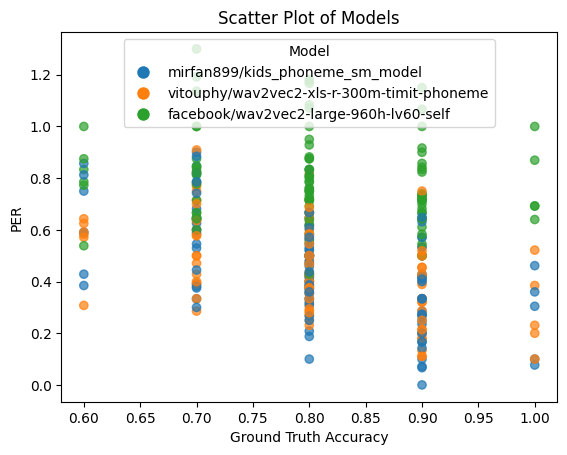

In [40]:
import matplotlib.pyplot as plt
import numpy as np

import matplotlib.colors as mcolors

# Assign a unique color to each model
unique_models = df['model'].unique()
color_map = {model: color for model, color in zip(unique_models, plt.cm.tab10.colors)}

# Map model names to colors
df['color'] = df['model'].map(color_map)

# Create the scatter plot
fig, ax = plt.subplots()
scatter = ax.scatter(df['ground_truth_accuracy'], df['per'], c=df['color'], alpha=0.7)

# Create legend
handles = [plt.Line2D([0], [0], marker='o', color='w', markersize=10, markerfacecolor=color_map[m]) for m in unique_models]
ax.legend(handles, unique_models, title="Model")

# Labels and title
ax.set_xlabel('Ground Truth Accuracy')
ax.set_ylabel('PER')
ax.set_title('Scatter Plot of Models')

plt.show()